In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from factor_analyzer import FactorAnalyzer

In [3]:
data=pd.read_csv("F:\\thesis\\diabetes\kaggle_diabetes.csv")

In [4]:
data.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [5]:
data.dtypes

Pregnancies                   int64
Glucose                       int64
BloodPressure                 int64
SkinThickness                 int64
Insulin                       int64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [6]:
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,2,138,62,35,0,33.6,0.127,47,1
1,0,84,82,31,125,38.2,0.233,23,0
2,0,145,0,0,0,44.2,0.630,31,1
3,0,135,68,42,250,42.3,0.365,24,1
4,1,139,62,41,480,40.7,0.536,21,0
...,...,...,...,...,...,...,...,...,...
1995,2,75,64,24,55,29.7,0.370,33,0
1996,8,179,72,42,130,32.7,0.719,36,1
1997,6,85,78,0,0,31.2,0.382,42,0
1998,0,129,110,46,130,67.1,0.319,26,1


In [7]:
data['Outcome'].value_counts()

0    1316
1     684
Name: Outcome, dtype: int64

In [8]:
#data["SkinThickness"].value_counts()
# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer(n_factors=3,rotation="varimax")
fa.fit(data)
# Check Eigenvalues
ev, v = fa.get_eigenvalues()
ev

array([2.33321008, 1.78841503, 1.1124126 , 0.90076811, 0.8110441 ,
       0.73244124, 0.5085961 , 0.43280174, 0.38031102])

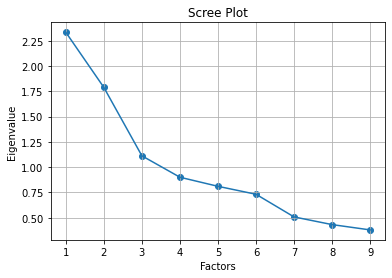

In [9]:
plt.scatter(range(1,data.shape[1]+1),ev)
plt.plot(range(1,data.shape[1]+1),ev)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

In [11]:
fa = FactorAnalyzer(n_factors=3,rotation=None).fit(data)
#fa.loadings_
fa.get_eigenvalues()

(array([2.33321008, 1.78841503, 1.1124126 , 0.90076811, 0.8110441 ,
        0.73244124, 0.5085961 , 0.43280174, 0.38031102]),
 array([ 1.80568617,  1.33412727,  0.62703384,  0.17887293,  0.11819385,
         0.03620074, -0.04169202, -0.10965034, -0.18192114]))

In [12]:
# Create factor analysis object and perform factor analysis
fa = FactorAnalyzer(n_factors=3,rotation="varimax")
fa.fit(data)
loading=fa.loadings_
loading

array([[-0.04821342,  0.64379568,  0.07950698],
       [ 0.15419163,  0.12097578,  0.84476065],
       [ 0.29422164,  0.29311578,  0.04194944],
       [ 0.84546081, -0.06018338, -0.06603639],
       [ 0.49415962, -0.14575131,  0.26740481],
       [ 0.50105121,  0.10057869,  0.18624527],
       [ 0.22960437, -0.01042611,  0.15121211],
       [-0.06783465,  0.79414757,  0.18113837],
       [ 0.15693417,  0.23770501,  0.48679233]])

In [13]:
pd.DataFrame.from_records(loading,index=["Pregnancies", "Glucose","BloodPressure","SkinThickness","Insulin","BMI","DiabetesPedigreeFunction","Age","Outcome"],
                         columns=["Factor1","Factor2","Factor3"])

,Factor1,Factor2,Factor3
Pregnancies,-0.048213,0.643796,0.079507
Glucose,0.154192,0.120976,0.844761
BloodPressure,0.294222,0.293116,0.041949
SkinThickness,0.845461,-0.060183,-0.066036
Insulin,0.494160,-0.145751,0.267405
BMI,0.501051,0.100579,0.186245
DiabetesPedigreeFunction,0.229604,-0.010426,0.151212
Age,-0.067835,0.794148,0.181138
Outcome,0.156934,0.237705,0.486792


In [14]:
fa.get_factor_variance()

(array([1.40466402, 1.23728918, 1.1248981 ]),
 array([0.15607378, 0.13747658, 0.12498868]),
 array([0.15607378, 0.29355036, 0.41853903]))

In [15]:
corelation=data.corr()
corelation

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
Pregnancies,1.000000,0.120405,0.149672,-0.063375,-0.076600,0.019475,-0.025453,0.539457,0.224437
Glucose,0.120405,1.000000,0.138044,0.062368,0.320371,0.226864,0.123243,0.254496,0.458421
BloodPressure,0.149672,0.138044,1.000000,0.198800,0.087384,0.281545,0.051331,0.238375,0.075958
SkinThickness,-0.063375,0.062368,0.198800,1.000000,0.448859,0.393760,0.178299,-0.111034,0.076040
Insulin,-0.076600,0.320371,0.087384,0.448859,1.000000,0.223012,0.192719,-0.085879,0.120924
BMI,0.019475,0.226864,0.281545,0.393760,0.223012,1.000000,0.125719,0.038987,0.276726
DiabetesPedigreeFunction,-0.025453,0.123243,0.051331,0.178299,0.192719,0.125719,1.000000,0.026569,0.155459
Age,0.539457,0.254496,0.238375,-0.111034,-0.085879,0.038987,0.026569,1.000000,0.236509
Outcome,0.224437,0.458421,0.075958,0.076040,0.120924,0.276726,0.155459,0.236509,1.000000


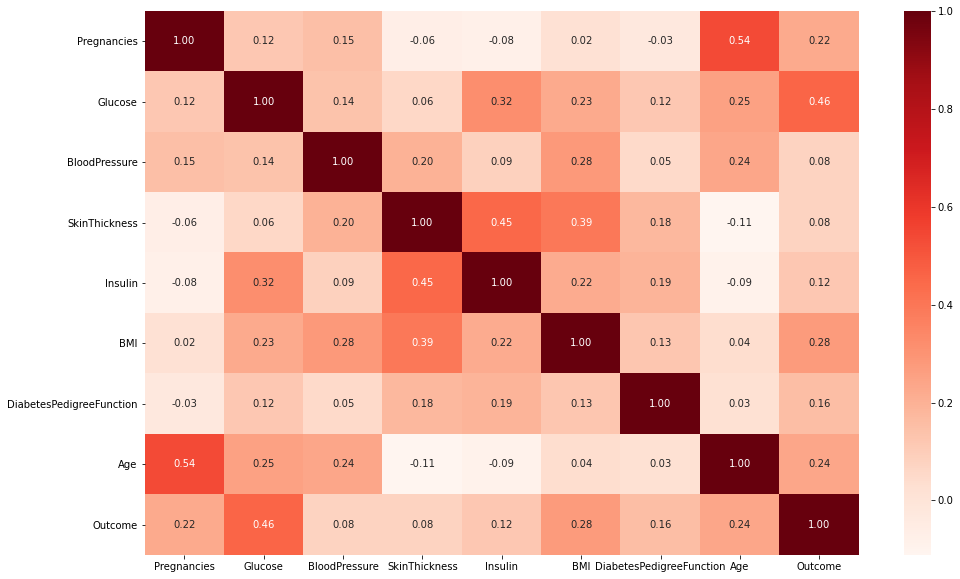

In [16]:
plt.figure(figsize=(16,10))
sns.heatmap(data.corr(),annot=True,fmt='.2f',cmap='Reds')
plt.show()

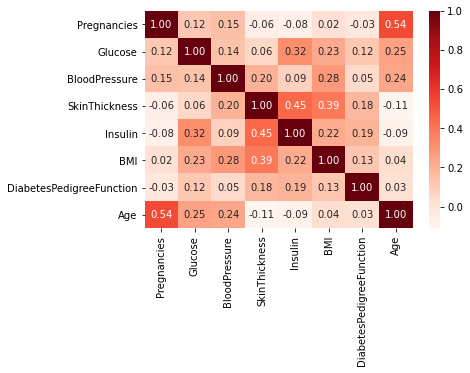

In [10]:
data_c=data[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age',]]
plt.figure(figsize=(6,4))
sns.heatmap(data_c.corr(),annot=True,fmt='.2f',cmap='Reds')
plt.show()

In [18]:
corelation['Pregnancies'].drop(['Pregnancies']).sort_values(ascending=False)

Age                         0.539457
Outcome                     0.224437
BloodPressure               0.149672
Glucose                     0.120405
BMI                         0.019475
DiabetesPedigreeFunction   -0.025453
SkinThickness              -0.063375
Insulin                    -0.076600
Name: Pregnancies, dtype: float64

In [19]:
data.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [20]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,2000.0,3.70350,3.306063,0.000,1.000,3.000,6.000,17.00
Glucose,2000.0,121.18250,32.068636,0.000,99.000,117.000,141.000,199.00
BloodPressure,2000.0,69.14550,19.188315,0.000,63.500,72.000,80.000,122.00
SkinThickness,2000.0,20.93500,16.103243,0.000,0.000,23.000,32.000,110.00
Insulin,2000.0,80.25400,111.180534,0.000,0.000,40.000,130.000,744.00
BMI,2000.0,32.19300,8.149901,0.000,27.375,32.300,36.800,80.60
DiabetesPedigreeFunction,2000.0,0.47093,0.323553,0.078,0.244,0.376,0.624,2.42
Age,2000.0,33.09050,11.786423,21.000,24.000,29.000,40.000,81.00
Outcome,2000.0,0.34200,0.474498,0.000,0.000,0.000,1.000,1.00


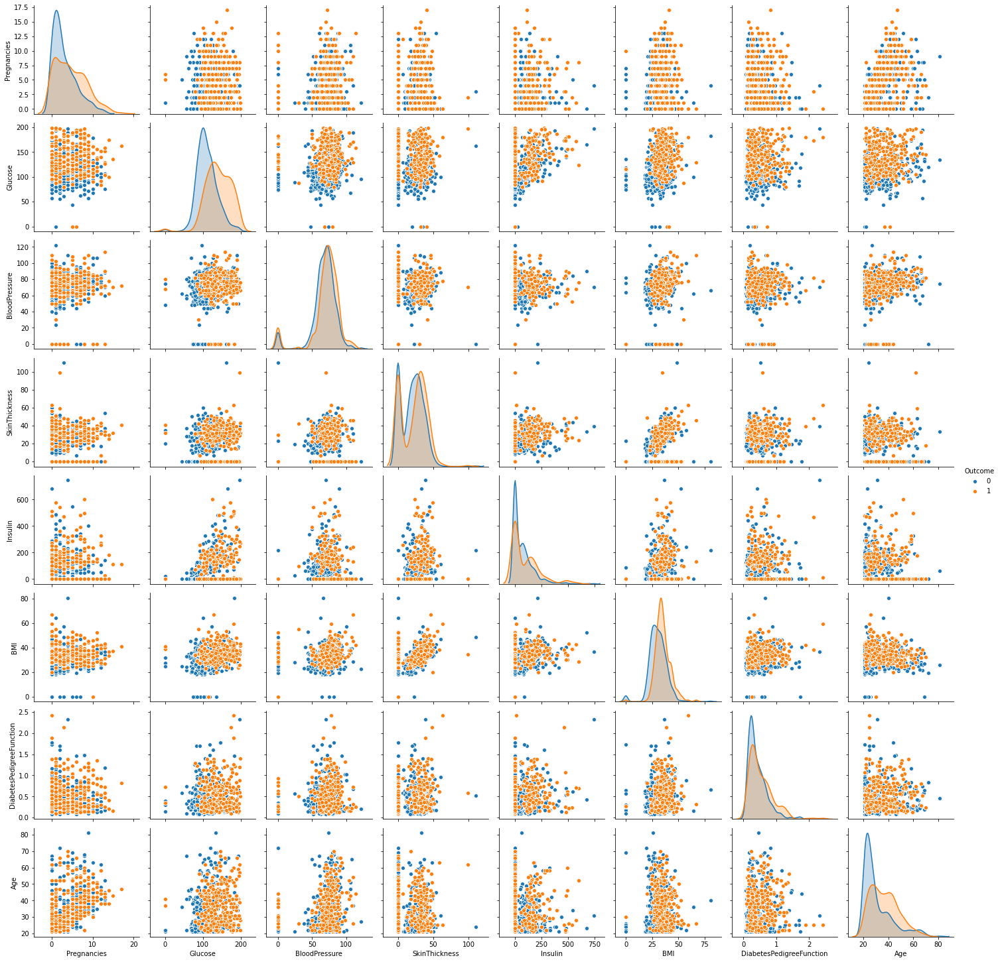

In [21]:
# pairplot for data distribution and outcome variable importance
sns.pairplot(data, hue= 'Outcome')
plt.show()

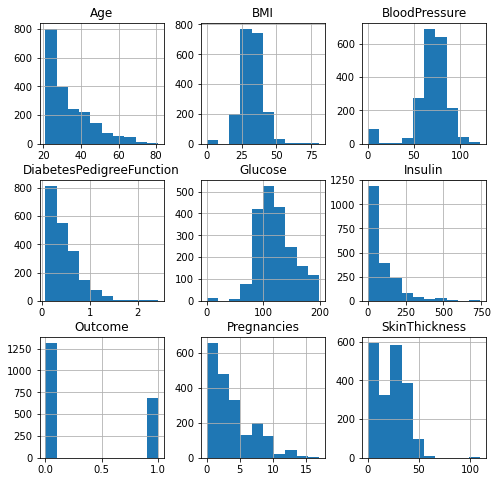

In [14]:
# for data distributions
data.hist(figsize= (8,8))
plt.show()

In [18]:
# To check the skewness in each attribute in the data
data.skew(axis = 0)

Pregnancies                 0.982366
Glucose                     0.158806
BloodPressure              -1.854476
SkinThickness               0.207228
Insulin                     1.996084
BMI                        -0.090455
DiabetesPedigreeFunction    1.811979
Age                         1.181267
Outcome                     0.666633
dtype: float64

In [19]:
# checking for zero variables
data.isin([0]).sum()

Pregnancies                  301
Glucose                       13
BloodPressure                 90
SkinThickness                573
Insulin                      956
BMI                           28
DiabetesPedigreeFunction       0
Age                            0
Outcome                     1316
dtype: int64

In [20]:
data.isin([np.NaN]).any()

Pregnancies                 False
Glucose                     False
BloodPressure               False
SkinThickness               False
Insulin                     False
BMI                         False
DiabetesPedigreeFunction    False
Age                         False
Outcome                     False
dtype: bool

In [21]:
# Replacing the 0 values from ['Glucose','BloodPressure','SkinThickness','Insulin','BMI'] by NaN
df_copy = data.copy(deep=True)
df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df_copy[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)
df_copy.isnull().sum()

Pregnancies                   0
Glucose                      13
BloodPressure                90
SkinThickness               573
Insulin                     956
BMI                          28
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [22]:
# Replacing NaN value by mean, median depending upon distribution

attributes = ['Glucose','BloodPressure','SkinThickness','Insulin','BMI']

for i in attributes:
    if i in ['Glucose','BloodPressure']:
        df_copy[i].fillna(df_copy[i].mean(), inplace = True)
    else :
        df_copy[i].fillna(df_copy[i].median(), inplace = True)
        
# check for NaN values 
df_copy.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [23]:
df_copy.shape

(2000, 9)

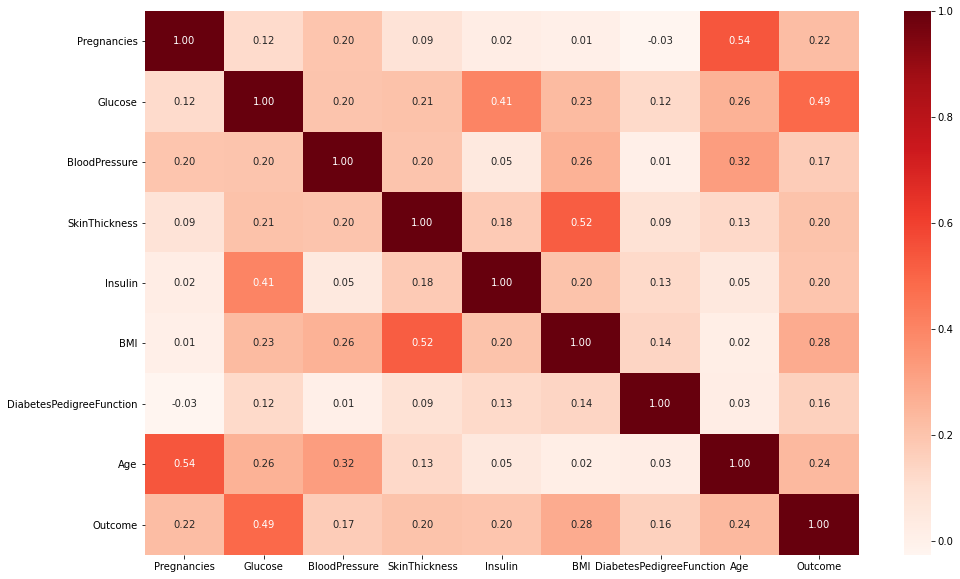

In [24]:
plt.figure(figsize=(16,10))
sns.heatmap(df_copy.corr(),annot=True,fmt='.2f',cmap='Reds')
plt.show()

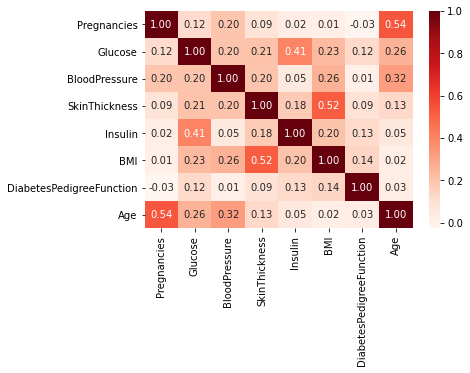

In [25]:
df_copy_c=df_copy[['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age',]]
plt.figure(figsize=(6,4))
sns.heatmap(df_copy_c.corr(),annot=True,fmt='.2f',cmap='Reds')
plt.show()

In [26]:
df_copy.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,2000.0,3.703500,3.306063,0.000,1.000,3.000,6.000,17.00
Glucose,2000.0,121.975340,30.533114,44.000,99.000,118.000,141.000,199.00
BloodPressure,2000.0,72.403665,11.949531,24.000,64.000,72.000,80.000,122.00
SkinThickness,2000.0,29.243500,9.124957,7.000,25.000,29.000,32.000,110.00
Insulin,2000.0,140.482000,81.562840,14.000,120.000,126.000,130.000,744.00
BMI,2000.0,32.646600,7.190196,18.200,27.600,32.400,36.800,80.60
DiabetesPedigreeFunction,2000.0,0.470930,0.323553,0.078,0.244,0.376,0.624,2.42
Age,2000.0,33.090500,11.786423,21.000,24.000,29.000,40.000,81.00
Outcome,2000.0,0.342000,0.474498,0.000,0.000,0.000,1.000,1.00


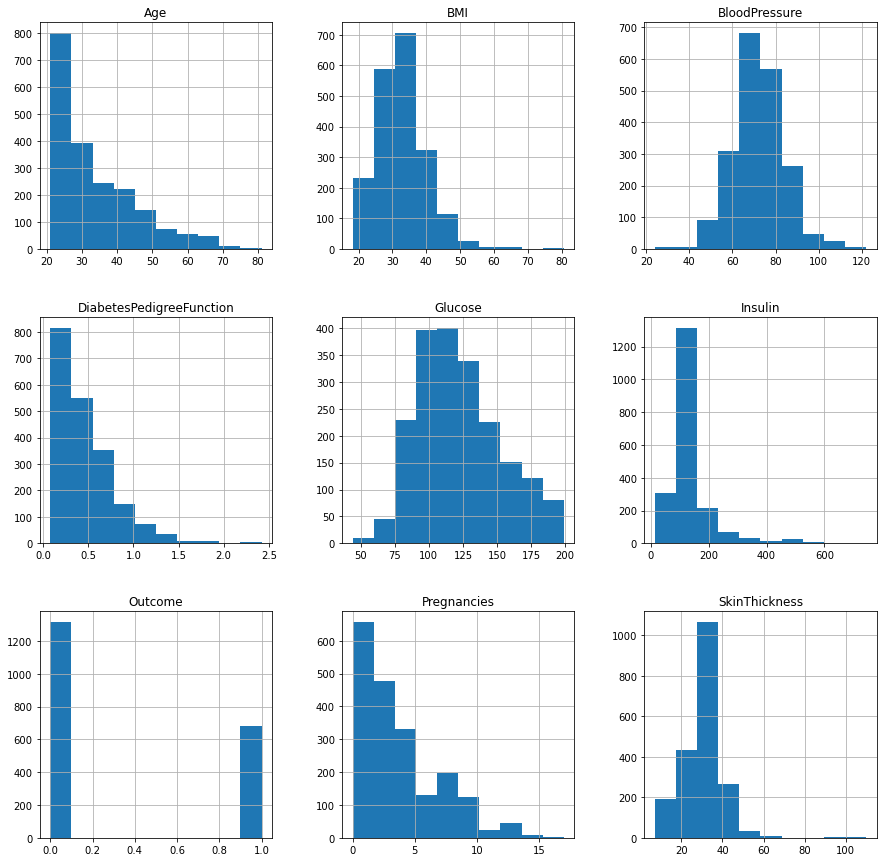

In [27]:
df_copy.hist(figsize=(15,15))
plt.show()

In [28]:
def target(dataframe, target):
    f, ax = plt.subplots(1, 2, figsize=(8,6))
    dataframe[target].value_counts().plot.pie(explode=[0, 0.1], autopct='%1.2f%%', ax=ax[0], shadow=True)
    ax[0].set_title(target + ' Distribution')
    ax[0].set_ylabel('')
    sns.countplot(target, data=dataframe, ax=ax[1])
    ax[1].set_title(target + " Count Plot")
    plt.show()

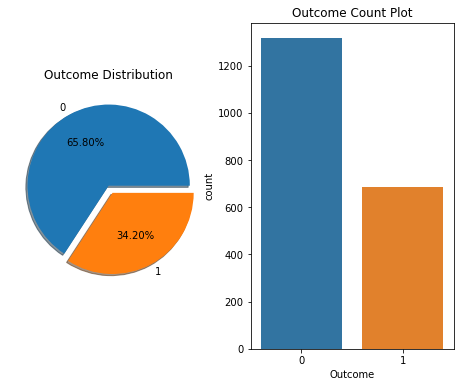

In [29]:
target(df_copy, "Outcome")

# Numerical Feature Analysis

In [31]:
import plotly.express as px
#import chart_studio.plotly as px

In [32]:
def feature_analysis (dataframe):
    for col in dataframe[:9]:
        fig = px.histogram(
        dataframe, x=col, color='Outcome',
        marginal='box', nbins=50,
        color_discrete_map={0: '#D62728', 1: '#3366CC'},
        barmode='overlay')
        fig.update_layout(height=600, width=800, 
        title_text='Diabetes Feature')
        fig.show()

In [33]:
feature_analysis(df_copy)

# Tree implementation

In [38]:
from sklearn.metrics import confusion_matrix 
from sklearn.model_selection import train_test_split 
from sklearn import tree
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 

In [39]:
#X = df_copy.iloc[:, :-1].values
#y = df_copy.iloc[:, -1].values
df_copy.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [40]:
X=df_copy[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y=df_copy['Outcome']

In [41]:
# splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state =125)

In [42]:
# scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

# Changing Max Depth

In [43]:
train_accuracy=[]
test_accuracy=[]
for depth in range(1,22):
    dt_model=tree.DecisionTreeClassifier(max_depth=depth, random_state=125)
    dt_model.fit(X_train,y_train)
    train_accuracy.append(dt_model.score(X_train,y_train))
    test_accuracy.append(dt_model.score(X_test,y_test))

In [44]:
frame=pd.DataFrame({'max_depth':range(1,22),'tarin_acc':train_accuracy,'test_acc':test_accuracy})
frame.head(22)

,max_depth,tarin_acc,test_acc
0,1,0.733125,0.7400
1,2,0.766250,0.7825
2,3,0.775625,0.7825
3,4,0.790625,0.7875
4,5,0.836250,0.8400
5,6,0.853125,0.8375
6,7,0.880625,0.8700
7,8,0.916875,0.9075
8,9,0.949375,0.9375
9,10,0.971875,0.9550


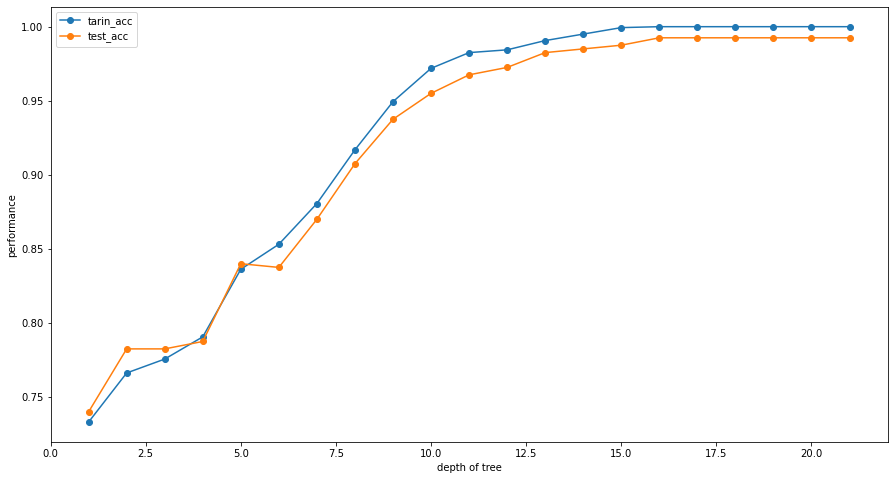

In [47]:
plt.figure(figsize=(15,8))
plt.plot(frame['max_depth'], frame['tarin_acc'], marker='o', label="tarin_acc")
plt.plot(frame['max_depth'], frame['test_acc'], marker='o',label="test_acc")
plt.ylabel('performance')
plt.xlabel('depth of tree')
plt.legend(loc='upper left') 

# Feature Importance for base Model

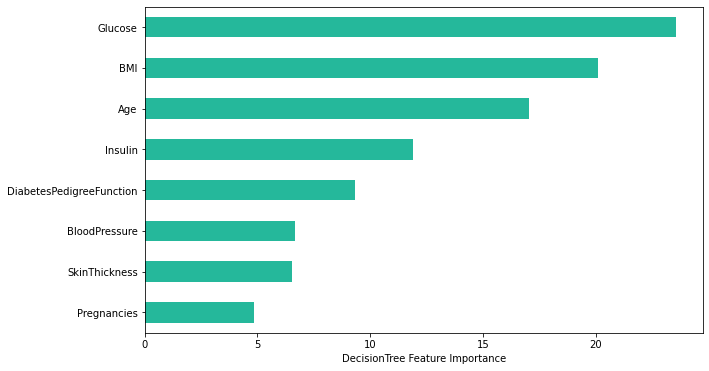

In [48]:
Importance = pd.DataFrame({'Importance':tree.DecisionTreeClassifier(splitter='best',criterion='entropy',max_depth=16).fit(X, y).feature_importances_*100}, 
                          index = X.columns)

Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = '#25B89B', figsize=(10,6))

plt.xlabel('DecisionTree Feature Importance')
plt.gca().legend_ = None

In [50]:
classifier=tree.DecisionTreeClassifier(splitter='best',criterion='entropy',max_depth=16)

In [51]:
classifier=classifier.fit(X_train,y_train)

In [52]:
#checking the Training score
DT_trainScore=classifier.score(X_train,y_train)
DT_trainScore

0.99875

In [53]:
y_pred=classifier.predict(X_test)

In [54]:
print(y_pred)

[0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 0 0 1 0 0
 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0
 1 1 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0
 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0
 1 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 1 0 0 1
 0 0 1 1 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 1 1 0 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 0 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 1 0
 0 1 0 0 1 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 1
 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]


In [58]:
from sklearn.metrics import accuracy_score
DT_testScore=accuracy_score(y_test,y_pred)
DT_testScore

0.99

In [59]:
# model metrics for classification problem
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score
DT_cm = confusion_matrix(y_test, y_pred)
print(DT_cm)

[[281   2]
 [  2 115]]


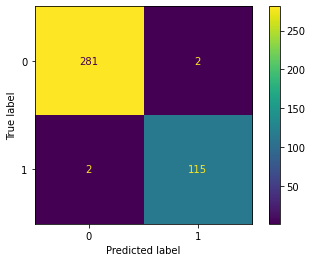

In [61]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(classifier, X_test, y_test)  
plt.show()

In [62]:
# classification report
DT_cr=classification_report(y_test, y_pred)
print(DT_cr)

              precision    recall  f1-score   support

           0       0.99      0.99      0.99       283
           1       0.98      0.98      0.98       117

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



In [58]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
# precision tp / (tp + fp)
precision = precision_score(y_test, y_pred)
print('Precision: %f' % precision)
# recall: tp / (tp + fn)
recall = recall_score(y_test, y_pred)
print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, y_pred)
print('F1 score: %f' % f1)

Precision: 0.982906
Recall: 0.982906
F1 score: 0.982906


In [59]:
from sklearn.metrics import mean_absolute_error
DT_MAE=mean_absolute_error(y_test, y_pred)
DT_MAE

0.01

In [60]:
from sklearn.metrics import mean_squared_error
DT_MSE=mean_squared_error(y_test, y_pred)
DT_MSE


0.01

In [63]:
#the root mean squared error
rmse = mean_squared_error(y_test, y_pred, squared = False)
rmse

0.1

# Tree Visualization

In [45]:
text_representation = tree.export_text(classifier)
print(text_representation)

|--- feature_1 <= 0.16
|   |--- feature_5 <= -0.87
|   |   |--- feature_4 <= -1.16
|   |   |   |--- feature_6 <= 0.54
|   |   |   |   |--- class: 0
|   |   |   |--- feature_6 >  0.54
|   |   |   |   |--- class: 1
|   |   |--- feature_4 >  -1.16
|   |   |   |--- class: 0
|   |--- feature_5 >  -0.87
|   |   |--- feature_7 <= -0.41
|   |   |   |--- feature_3 <= -0.09
|   |   |   |   |--- feature_5 <= 0.01
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_5 >  0.01
|   |   |   |   |   |--- feature_4 <= -1.19
|   |   |   |   |   |   |--- feature_1 <= -1.03
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_1 >  -1.03
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_4 >  -1.19
|   |   |   |   |   |   |--- feature_6 <= 1.08
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_6 >  1.08
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |--- feature_3 >  -0.09
|   |   |   |   |--- feature_5 <= 1.75


In [137]:
feature_names=['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']
feature_names

['Pregnancies',
 'Glucose',
 'BloodPressure',
 'SkinThickness',
 'Insulin',
 'BMI',
 'DiabetesPedigreeFunction',
 'Age']

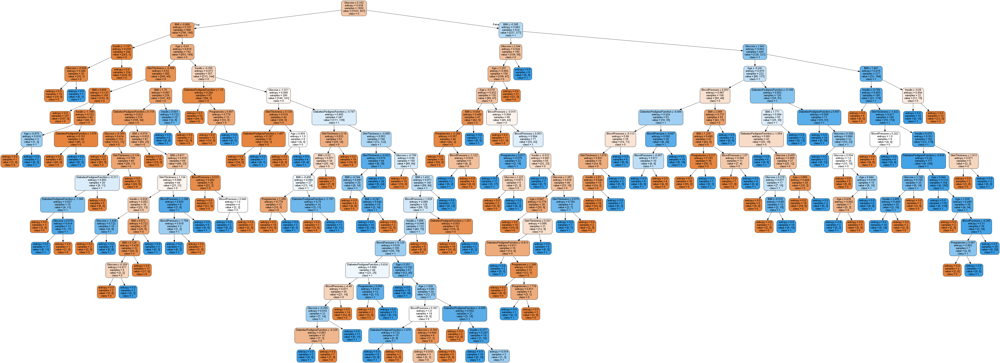

In [31]:
from sklearn.tree import export_graphviz
from io import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(classifier, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_names,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('diabetes.png')
Image(graph.create_png())

In [37]:
#from sklearn.tree import plot_tree


In [43]:
'''feature_names = df_copy.columns[:8]
target_names = ["0","1"]
plt.figure(figsize=(50,20))
dfe=plot_tree(classifier, 
          feature_names = feature_names, 
          class_names = target_names, 
          filled = True, 
          rounded = True)

plt.savefig('tree_visualization3.jpg')'''

'feature_names = df_copy.columns[:8]\ntarget_names = ["0","1"]\nplt.figure(figsize=(50,20))\ndfe=plot_tree(classifier, \n          feature_names = feature_names, \n          class_names = target_names, \n          filled = True, \n          rounded = True)\n\nplt.savefig(\'tree_visualization3.jpg\')'

# Test New DataSet

In [32]:
df1=pd.read_csv(r"F:\\thesis\\diabetes\test_diabetes_m.csv")
df1

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33
...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.0,180.0,32.9,0.171,63
764,2,122.0,70.0,27.0,125.0,36.8,0.340,27
765,5,121.0,72.0,23.0,112.0,26.2,0.245,30
766,1,126.0,60.0,29.0,125.0,30.1,0.349,47


In [33]:
#test_diabetes=df1[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
#test=test_diabetes.values

In [34]:
df1.max()

Pregnancies                  17.00
Glucose                     199.00
BloodPressure               122.00
SkinThickness                99.00
Insulin                     846.00
BMI                          67.10
DiabetesPedigreeFunction      2.42
Age                          81.00
dtype: float64

In [35]:
#new_df=pd.DataFrame([[0,99,70,30,70,26,0.8,40],[2,199,122,110,744,80.50,2.83,81,],[5,199,122,110,700,76.80,2.83,81,],
#                    [2,199,122,110,85,80.50,2.83,81,],[17,199,122,110,744,80.60,2.42,81],[2,199,122,110,744,79,2.83,81,]],
#        columns=['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
#       'BMI', 'DiabetesPedigreeFunction', 'Age'])


In [36]:
new_df= sc.transform(df1)

In [37]:
p=classifier.predict(new_df)

In [38]:
print(p)

[1 0 1 0 0 0 0 1 0 0 0 1 0 0 1 1 1 1 0 0 0 0 1 1 0 1 0 0 0 0 1 1 0 0 0 0 0
 1 1 1 0 0 0 1 0 1 0 0 1 0 0 0 0 1 0 0 1 0 0 0 0 1 0 0 1 0 1 0 0 0 1 0 1 0
 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 1 1
 1 0 0 1 1 1 0 0 0 1 0 0 0 1 1 0 0 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0
 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 1 0 1 0 0 0 0 0
 1 1 1 1 1 0 0 1 1 0 1 0 1 1 1 0 0 0 0 1 0 1 1 0 1 0 0 0 1 1 1 1 0 1 1 1 1
 0 0 0 0 0 1 0 0 1 1 0 0 0 1 1 1 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 1 1 0 0 0
 1 0 1 0 0 1 0 1 0 0 1 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 1 0 0 0 1 1 1 0 0
 1 0 1 0 1 1 0 1 0 0 1 0 1 1 0 0 1 0 0 0 0 1 0 1 0 1 1 1 0 0 1 0 1 0 0 0 1
 0 0 0 0 1 1 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 1 0 1 1 0 0 1 0 0 1 0 0 1
 1 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 0 1 0 0 1 0 0 1 0 1 1 0 1 0 1 0 1
 0 1 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0 0 0 0 0 1 0 0 0 0 1 0 0 1
 1 1 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 1
 0 0 0 1 1 0 0 0 0 0 0 0 

In [39]:
c=0
for x in range(len(p)):
    if p[x]==1:
        #print(p[x])
        c=c+1
print(c)    

263


In [40]:

output=[]


In [41]:
for x in range(len(p)):
    output.append(p[x])

In [42]:
#output
df1["output"]=output

In [43]:
df1[df1['output']==1]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,output
0,6,148.0,72.000000,35.0,125.0,33.6,0.627,50,1
2,8,183.0,64.000000,29.0,125.0,23.3,0.672,32,1
7,10,115.0,72.405184,29.0,125.0,35.3,0.134,29,1
11,10,168.0,74.000000,29.0,125.0,38.0,0.537,34,1
14,5,166.0,72.000000,19.0,175.0,25.8,0.587,51,1
...,...,...,...,...,...,...,...,...,...
755,1,128.0,88.000000,39.0,110.0,36.5,1.057,37,1
757,0,123.0,72.000000,29.0,125.0,36.3,0.258,52,1
759,6,190.0,92.000000,29.0,125.0,35.5,0.278,66,1
761,9,170.0,74.000000,31.0,125.0,44.0,0.403,43,1


In [31]:
# check for model scores as part of model evalution
print("training score: {} and test score: {} ".format(classifier.score(X_train, y_train), classifier.score(X_test, y_test)))

training score: 0.99875 and test score: 0.99 


# Random Forest Classification

In [106]:
df_copy_R = data.copy(deep=True)
df_copy_R[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']] = df_copy_R[['Glucose','BloodPressure','SkinThickness','Insulin','BMI']].replace(0,np.NaN)
df_copy_R.isnull().sum()

Pregnancies                   0
Glucose                      13
BloodPressure                90
SkinThickness               573
Insulin                     956
BMI                          28
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [107]:
# Replacing NaN value by mean, median depending upon distribution

attributes = ['Glucose','BloodPressure','SkinThickness','Insulin','BMI']

for i in attributes:
    if i in ['Glucose','BloodPressure']:
        df_copy_R[i].fillna(df_copy_R[i].mean(), inplace = True)
    else :
        df_copy_R[i].fillna(df_copy_R[i].median(), inplace = True)
        
# check for NaN values 
df_copy_R.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [108]:
#X = df_copy_R.iloc[:, :-1].values
#y = df_copy_R.iloc[:, 8].values
X=df_copy_R[['Pregnancies','Glucose','BloodPressure','SkinThickness','Insulin','BMI','DiabetesPedigreeFunction','Age']]
y=df_copy_R['Outcome']

In [109]:
# splitting the data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state =125)

In [110]:
# scaling
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [111]:
from sklearn.ensemble import RandomForestClassifier
for esti in range(1,50):
    for depth in range(1,20):
        dt_model=RandomForestClassifier(n_estimators= esti,max_depth=depth,random_state= 0, n_jobs= -1)
        dt_model.fit(X_train,y_train)
        train_accuracy=dt_model.score(X_train,y_train)
        test_accuracy=dt_model.score(X_test,y_test)
        print("n_estimators: {} , max depth: {} , tarin_acc: {} , test_acc: {} ".format(esti,depth,train_accuracy,test_accuracy))

n_estimators: 1 , max depth: 1 , tarin_acc: 0.645625 , test_acc: 0.7075 
n_estimators: 1 , max depth: 2 , tarin_acc: 0.68875 , test_acc: 0.685 
n_estimators: 1 , max depth: 3 , tarin_acc: 0.74625 , test_acc: 0.7575 
n_estimators: 1 , max depth: 4 , tarin_acc: 0.756875 , test_acc: 0.7375 
n_estimators: 1 , max depth: 5 , tarin_acc: 0.78375 , test_acc: 0.7725 
n_estimators: 1 , max depth: 6 , tarin_acc: 0.793125 , test_acc: 0.7975 
n_estimators: 1 , max depth: 7 , tarin_acc: 0.79375 , test_acc: 0.79 
n_estimators: 1 , max depth: 8 , tarin_acc: 0.841875 , test_acc: 0.8225 
n_estimators: 1 , max depth: 9 , tarin_acc: 0.88625 , test_acc: 0.8425 
n_estimators: 1 , max depth: 10 , tarin_acc: 0.89125 , test_acc: 0.8375 
n_estimators: 1 , max depth: 11 , tarin_acc: 0.94125 , test_acc: 0.8725 
n_estimators: 1 , max depth: 12 , tarin_acc: 0.93 , test_acc: 0.8725 
n_estimators: 1 , max depth: 13 , tarin_acc: 0.953125 , test_acc: 0.9075 
n_estimators: 1 , max depth: 14 , tarin_acc: 0.968125 , test_

n_estimators: 7 , max depth: 4 , tarin_acc: 0.811875 , test_acc: 0.8125 
n_estimators: 7 , max depth: 5 , tarin_acc: 0.833125 , test_acc: 0.825 
n_estimators: 7 , max depth: 6 , tarin_acc: 0.875 , test_acc: 0.865 
n_estimators: 7 , max depth: 7 , tarin_acc: 0.906875 , test_acc: 0.8875 
n_estimators: 7 , max depth: 8 , tarin_acc: 0.945625 , test_acc: 0.93 
n_estimators: 7 , max depth: 9 , tarin_acc: 0.958125 , test_acc: 0.925 
n_estimators: 7 , max depth: 10 , tarin_acc: 0.979375 , test_acc: 0.93 
n_estimators: 7 , max depth: 11 , tarin_acc: 0.98625 , test_acc: 0.955 
n_estimators: 7 , max depth: 12 , tarin_acc: 0.993125 , test_acc: 0.945 
n_estimators: 7 , max depth: 13 , tarin_acc: 0.9975 , test_acc: 0.975 
n_estimators: 7 , max depth: 14 , tarin_acc: 0.998125 , test_acc: 0.9775 
n_estimators: 7 , max depth: 15 , tarin_acc: 0.998125 , test_acc: 0.9775 
n_estimators: 7 , max depth: 16 , tarin_acc: 0.998125 , test_acc: 0.9775 
n_estimators: 7 , max depth: 17 , tarin_acc: 0.99875 , test_

n_estimators: 13 , max depth: 4 , tarin_acc: 0.816875 , test_acc: 0.8275 
n_estimators: 13 , max depth: 5 , tarin_acc: 0.851875 , test_acc: 0.8275 
n_estimators: 13 , max depth: 6 , tarin_acc: 0.8875 , test_acc: 0.88 
n_estimators: 13 , max depth: 7 , tarin_acc: 0.916875 , test_acc: 0.885 
n_estimators: 13 , max depth: 8 , tarin_acc: 0.949375 , test_acc: 0.9325 
n_estimators: 13 , max depth: 9 , tarin_acc: 0.97 , test_acc: 0.94 
n_estimators: 13 , max depth: 10 , tarin_acc: 0.98625 , test_acc: 0.935 
n_estimators: 13 , max depth: 11 , tarin_acc: 0.9975 , test_acc: 0.975 
n_estimators: 13 , max depth: 12 , tarin_acc: 0.998125 , test_acc: 0.965 
n_estimators: 13 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 13 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 13 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.9775 
n_estimators: 13 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 13 , max depth: 17 , tarin_acc: 1.0 , test_acc: 

n_estimators: 19 , max depth: 6 , tarin_acc: 0.8875 , test_acc: 0.88 
n_estimators: 19 , max depth: 7 , tarin_acc: 0.914375 , test_acc: 0.89 
n_estimators: 19 , max depth: 8 , tarin_acc: 0.95625 , test_acc: 0.935 
n_estimators: 19 , max depth: 9 , tarin_acc: 0.976875 , test_acc: 0.96 
n_estimators: 19 , max depth: 10 , tarin_acc: 0.99 , test_acc: 0.9625 
n_estimators: 19 , max depth: 11 , tarin_acc: 0.99625 , test_acc: 0.975 
n_estimators: 19 , max depth: 12 , tarin_acc: 0.998125 , test_acc: 0.97 
n_estimators: 19 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 19 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 19 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.9775 
n_estimators: 19 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 19 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 19 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9775 
n_estimators: 19 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9775 
n_

n_estimators: 25 , max depth: 7 , tarin_acc: 0.91125 , test_acc: 0.895 
n_estimators: 25 , max depth: 8 , tarin_acc: 0.9525 , test_acc: 0.93 
n_estimators: 25 , max depth: 9 , tarin_acc: 0.975625 , test_acc: 0.95 
n_estimators: 25 , max depth: 10 , tarin_acc: 0.988125 , test_acc: 0.9625 
n_estimators: 25 , max depth: 11 , tarin_acc: 0.99375 , test_acc: 0.9675 
n_estimators: 25 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.965 
n_estimators: 25 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 25 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 25 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.9775 
n_estimators: 25 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 25 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 25 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.975 
n_estimators: 25 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 26 , max depth: 1 , tarin_acc: 0.645625 , test_acc: 0.70

n_estimators: 31 , max depth: 8 , tarin_acc: 0.956875 , test_acc: 0.9425 
n_estimators: 31 , max depth: 9 , tarin_acc: 0.980625 , test_acc: 0.945 
n_estimators: 31 , max depth: 10 , tarin_acc: 0.98625 , test_acc: 0.96 
n_estimators: 31 , max depth: 11 , tarin_acc: 0.994375 , test_acc: 0.97 
n_estimators: 31 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 31 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 31 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 15 , tarin_acc: 0.999375 , test_acc: 0.985 
n_estimators: 31 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 31 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 32 , max depth: 1 , tarin_acc: 0.650625 , test_acc: 0.715 
n_estimators: 32 , max depth: 2 , tarin_acc: 0.7525 , test_acc: 0.7

n_estimators: 37 , max depth: 9 , tarin_acc: 0.983125 , test_acc: 0.9575 
n_estimators: 37 , max depth: 10 , tarin_acc: 0.99125 , test_acc: 0.97 
n_estimators: 37 , max depth: 11 , tarin_acc: 0.995625 , test_acc: 0.9725 
n_estimators: 37 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 37 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 37 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 15 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 37 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 37 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 38 , max depth: 1 , tarin_acc: 0.650625 , test_acc: 0.715 
n_estimators: 38 , max depth: 2 , tarin_acc: 0.753125 , test_acc: 0.7575 
n_estimators: 38 , max depth: 3 , tarin_acc: 0.80125 , test_acc: 0.8

n_estimators: 43 , max depth: 10 , tarin_acc: 0.989375 , test_acc: 0.965 
n_estimators: 43 , max depth: 11 , tarin_acc: 0.995 , test_acc: 0.97 
n_estimators: 43 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 43 , max depth: 13 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 43 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 43 , max depth: 15 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 43 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 43 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 43 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 43 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 44 , max depth: 1 , tarin_acc: 0.65 , test_acc: 0.7125 
n_estimators: 44 , max depth: 2 , tarin_acc: 0.751875 , test_acc: 0.7575 
n_estimators: 44 , max depth: 3 , tarin_acc: 0.7975 , test_acc: 0.8025 
n_estimators: 44 , max depth: 4 , tarin_acc: 0.821875 , test_acc: 0.8275 
n_

n_estimators: 49 , max depth: 11 , tarin_acc: 0.995625 , test_acc: 0.975 
n_estimators: 49 , max depth: 12 , tarin_acc: 0.99875 , test_acc: 0.98 
n_estimators: 49 , max depth: 13 , tarin_acc: 0.999375 , test_acc: 0.9825 
n_estimators: 49 , max depth: 14 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 49 , max depth: 15 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 49 , max depth: 16 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 49 , max depth: 17 , tarin_acc: 1.0 , test_acc: 0.9825 
n_estimators: 49 , max depth: 18 , tarin_acc: 1.0 , test_acc: 0.9875 
n_estimators: 49 , max depth: 19 , tarin_acc: 1.0 , test_acc: 0.9825 


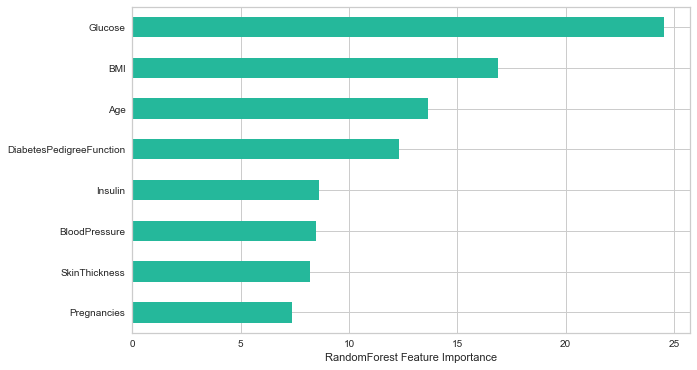

In [112]:
Importance = pd.DataFrame({'Importance':RandomForestClassifier(n_estimators=33,max_depth=15,random_state= 0, n_jobs= -1).fit(X, y).feature_importances_*100}, 
                          index = X.columns)

Importance.sort_values(by = 'Importance', 
                       axis = 0, 
                       ascending = True).plot(kind = 'barh', 
                                              color = '#25B89B', figsize=(10,6))

plt.xlabel('RandomForest Feature Importance')
plt.gca().legend_ = None

In [114]:
from sklearn.ensemble import RandomForestClassifier

In [115]:
# from our observations randomforest is best fit
clf = RandomForestClassifier(n_estimators=33,max_depth=15,random_state= 0, n_jobs= -1)
clf=clf.fit(X_train, y_train)

In [116]:
#checking the Training score
RF_trainScore=clf.score(X_train,y_train)
RF_trainScore

1.0

In [117]:
# model predictions
y_pred = clf.predict(X_test)

In [118]:
print(y_pred)

[0 0 0 0 1 1 0 0 0 0 1 1 0 0 0 1 0 0 0 0 1 1 1 1 0 1 0 0 1 0 1 1 0 0 1 0 0
 1 0 0 1 0 0 0 0 1 0 0 1 0 0 1 1 1 0 0 0 0 1 0 0 0 0 1 0 0 0 1 0 1 0 0 1 0
 1 1 0 1 1 0 0 1 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 1 1 0 0 0 1 0 0 0 1 0
 0 1 0 1 0 0 1 0 0 1 0 0 0 0 0 0 0 1 1 1 0 1 0 1 1 0 0 0 1 1 1 0 0 1 0 0 0
 1 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 1 1 0 0 1 1 0 0 0 0 0 1 0 0 1 0 1 0 0 0
 1 0 0 0 0 1 1 1 0 0 1 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 1 0 1 0 1 0 1 0 0 1
 0 0 1 1 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0
 0 1 1 1 0 1 0 1 0 1 0 1 1 0 0 0 0 1 1 0 1 1 1 0 0 0 1 0 0 0 1 0 0 0 0 0 0
 0 0 1 0 0 1 0 0 0 1 0 0 0 0 0 0 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 0 0 0 0 0 0
 0 1 0 0 1 1 0 0 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 0 0 1 0 0 0 0 0 0 0 0 0 1 0
 0 0 0 1 1 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0]


In [119]:
# accuracy score
RF_testScore=accuracy_score(y_test, y_pred)
RF_testScore

0.9875

In [124]:
# model metrics for classification problem
from sklearn.metrics import confusion_matrix,classification_report, accuracy_score
RF_cm = confusion_matrix(y_test, y_pred)
print(RF_cm)

[[278   5]
 [  0 117]]


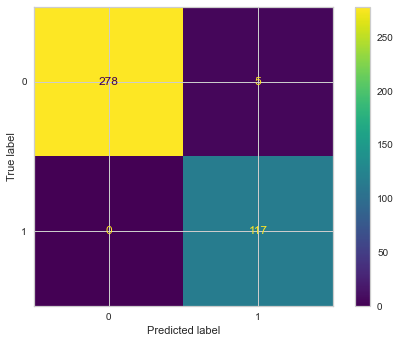

In [131]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(clf, X_test, y_test) 
plt.show()


In [132]:
# classification report
RF_cr=classification_report(y_test, y_pred)
print(RF_cr)

              precision    recall  f1-score   support

           0       1.00      0.98      0.99       283
           1       0.96      1.00      0.98       117

    accuracy                           0.99       400
   macro avg       0.98      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400



In [133]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
# precision tp / (tp + fp)
precision = precision_score(y_test, y_pred)
print('Precision: %f' % precision)
# recall: tp / (tp + fn)
recall = recall_score(y_test, y_pred)
print('Recall: %f' % recall)
# f1: 2 tp / (2 tp + fp + fn)
f1 = f1_score(y_test, y_pred)
print('F1 score: %f' % f1)

Precision: 0.959016
Recall: 1.000000
F1 score: 0.979079


In [134]:
from sklearn.metrics import mean_absolute_error
RF_MAE=mean_absolute_error(y_test, y_pred)
print(RF_MAE)
from sklearn.metrics import mean_squared_error
RF_MSE=mean_squared_error(y_test, y_pred)
print(RF_MSE)

0.0125
0.0125


In [135]:
#the root mean squared error
rmse = mean_squared_error(y_test, y_pred, squared = False)
print('root mean squared error: %.3f' % rmse)

root mean squared error: 0.112


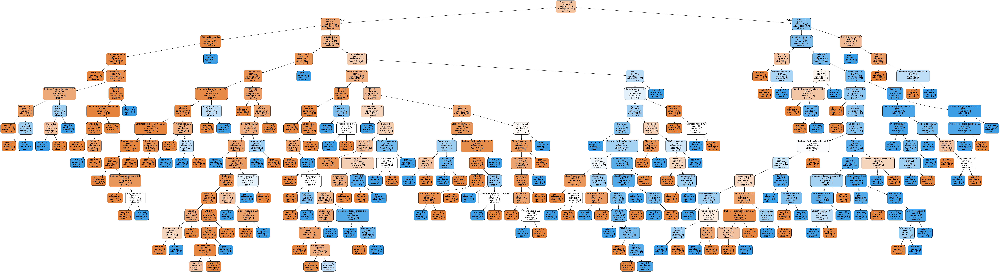

In [138]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
from io import StringIO  
from IPython.display import Image  
import pydotplus

# Pull out one tree from the forest
tree = clf.estimators_[5]
dot_data = StringIO()

# Export the image to a dot file
export_graphviz(tree, out_file = dot_data, feature_names = feature_names,class_names=['0','1'],
                filled=True, rounded = True,special_characters=True, precision = 1)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree_RF1.png')
Image(graph.create_png())

In [105]:
df2=pd.read_csv(r"F:\\thesis\\diabetes\test_diabetes_m.csv")

In [106]:
new_test = sc.transform(df2)

In [107]:
p=clf.predict(new_test)

In [108]:
c=0
for x in range(len(p)):
    if p[x]==1:
        #print(p[x])
        c=c+1
print(c)

259


# Algorithms Comparision

In [57]:
from tabulate import tabulate
models = pd.DataFrame({
                          'Model': ['Decision Tree',
                                    'Random Forest',],
                          'Scoretrain': [DT_trainScore, 
                                         RF_trainScore,],
                       
                          'scoretest':[DT_testScore,
                                        RF_testScore,],
                        
                        'mean_absolute_error':[
                            DT_MAE,
                            RF_MAE,],
                        'mean_squared_error':[
                            DT_MSE,
                            RF_MSE,
                        ]

})
print("Comparision Between Decision Tree and Random Forest")               
print(tabulate(models , headers = ['Model' , 'Train Score' , 'Test Score','mean_absolute_error','mean_squared_error'] , tablefmt = 'psql' , showindex =False)) 


Comparision Between Decision Tree and Random Forest
+---------------+---------------+--------------+-----------------------+----------------------+
| Model         |   Train Score |   Test Score |   mean_absolute_error |   mean_squared_error |
|---------------+---------------+--------------+-----------------------+----------------------|
| Decision Tree |       0.99875 |        0.99  |                 0.01  |                0.01  |
| Random Forest |       1       |        0.995 |                 0.005 |                0.005 |
+---------------+---------------+--------------+-----------------------+----------------------+


In [62]:
print("classification Report Comparision:\n Decision Tree:\n",DT_cr,"\n Random Forest:\n",RF_cr)

classification Report Comparision:
 Decision Tree:
               precision    recall  f1-score   support

           0       0.99      0.99      0.99       283
           1       0.98      0.98      0.98       117

    accuracy                           0.99       400
   macro avg       0.99      0.99      0.99       400
weighted avg       0.99      0.99      0.99       400
 
 Random Forest:
               precision    recall  f1-score   support

           0       1.00      0.99      1.00       283
           1       0.98      1.00      0.99       117

    accuracy                           0.99       400
   macro avg       0.99      1.00      0.99       400
weighted avg       1.00      0.99      1.00       400

